# Embedding Model 만들기

In [2]:
#Dependencies
import pandas as pd
import numpy as np
import itertools

import logging, os

logging.disable(logging.WARNING)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

import tensorflow as tf

import matplotlib.pyplot as plt
import plotly.express as px

import time
import tqdm


ROOT_DIR = os.getcwd()
DATA_DIR = os.path.join(ROOT_DIR, 'ml-1m')
STATE_SIZE = 10

In [3]:
#Loading datasets
ratings_list = [i.strip().split("::") for i in open(os.path.join(DATA_DIR,'ratings.dat'), 'r').readlines()]
users_list = [i.strip().split("::") for i in open(os.path.join(DATA_DIR,'users.dat'), 'r').readlines()]
movies_list = [i.strip().split("::") for i in open(os.path.join(DATA_DIR,'movies.dat'),encoding='latin-1').readlines()]
ratings_df = pd.DataFrame(ratings_list, columns = ['UserID', 'MovieID', 'Rating', 'Timestamp'], dtype = np.uint32)
movies_df = pd.DataFrame(movies_list, columns = ['MovieID', 'Title', 'Genres'])
movies_df['MovieID'] = movies_df['MovieID'].apply(pd.to_numeric)
users_df = pd.DataFrame(users_list, columns=['UserID','Gender','Age','Occupation','Zip-code'])

In [4]:
# 영화 id를 영화 제목으로
movies_id_to_movies = {movie[0]: movie[1:] for movie in movies_list}

In [5]:
len(movies_list)

3883

In [6]:
movies_df.head(5)

,MovieID,Title,Genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [7]:
ratings_df.head(5)

,UserID,MovieID,Rating,Timestamp
0,1,1193,5,978300760
1,1,661,3,978302109
2,1,914,3,978301968
3,1,3408,4,978300275
4,1,2355,5,978824291


In [8]:
genres = ['Action',
        'Adventure',
        'Animation',
        "Children's",
        'Comedy',
        'Crime',
        'Documentary',
        'Drama',
        'Fantasy',
        'Film-Noir',
        'Horror',
        'Musical',
        'Mystery',
        'Romance',
        'Sci-Fi',
        'Thriller',
        'War',
        'Western']

영화와 장르간의 상관관계, 영화와 유저와의 상관관계를 이용해 영화, 장르, 유저의 임배딩을 만들자.

영화-장르의 임배딩을 먼저 학습 후, 학습된 영화 임배딩을 이용해 영화-유저의 임배딩을 학습

## 영화, 장르, 유저 dataframe만들기

In [9]:
# 영화id와 genres dataframe 만들기
movies_genres_df = movies_df[['MovieID', 'Genres']]

In [10]:
movies_genres_df.head(5)

,MovieID,Genres
0,1,Animation|Children's|Comedy
1,2,Adventure|Children's|Fantasy
2,3,Comedy|Romance
3,4,Comedy|Drama
4,5,Comedy


In [11]:
# 각 영화별 Gneres 분할 후 인덱싱
def _split_and_index(string):
    string = string.split('|')
    for i, s in enumerate(string):
        string[i] = genres.index(s)
    return string

movies_genres_df['Genres'] = movies_genres_df['Genres'].map(lambda x : _split_and_index(x))

<ipython-input-11-e0b1d6dbb05b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies_genres_df['Genres'] = movies_genres_df['Genres'].map(lambda x : _split_and_index(x))


In [12]:
movies_genres_df.head(5)

,MovieID,Genres
0,1,"[2, 3, 4]"
1,2,"[1, 3, 8]"
2,3,"[4, 13]"
3,4,"[4, 7]"
4,5,[4]


In [13]:
# 결측값 확인
movies_genres_df.isnull().sum()

MovieID    0
Genres     0
dtype: int64

In [14]:
# 고유값 확인
len(movies_genres_df['MovieID'])

3883

In [15]:
movies_genres_df['MovieID'].nunique()

3883

In [16]:
# 유저별 영화 rating dataframe 만들기
user_movie_rating_df = ratings_df[['UserID','MovieID','Rating']]

In [17]:
user_movie_rating_df.head(5)

,UserID,MovieID,Rating
0,1,1193,5
1,1,661,3
2,1,914,3
3,1,3408,4
4,1,2355,5


In [18]:
# 결측값 확인
user_movie_rating_df.isnull().sum()

UserID     0
MovieID    0
Rating     0
dtype: int64

In [19]:
user_movie_rating_df['UserID'].nunique()

6040

In [20]:
user_movie_rating_df['MovieID'].nunique()

3706

##  Case1. 

## 모델 만들기

In [21]:
from tensorflow.keras.layers import InputLayer, Embedding, Dot, Reshape, Dense
from tensorflow.keras.models import Model

### Movie Genre Embedding 모델 

In [22]:
class MovieGenreEmbedding(tf.keras.Model):
    def __init__(self, len_movies, len_genres, embedding_size):
        super(MovieGenreEmbedding, self).__init__()
        self.m_g_input = InputLayer(name='input_layer', input_shape=(2,))
        # embedding
        self.m_embedding = Embedding(name='movie_embedding', input_dim=len_movies, output_dim=embedding_size)
        self.g_embedding = Embedding(name='genre_embedding', input_dim=len_genres, output_dim=embedding_size)
        # dot product
        self.m_g_merge = Dot(name='movie_genre_dot', normalize=True, axes=1)
        # output
        self.m_g_fc = Dense(1, activation='sigmoid')
        
    def call(self, x):
        x = self.m_g_input(x)
        memb = self.m_embedding(x[0])
        gemb = self.g_embedding(x[1])
        m_g = self.m_g_merge([memb, gemb])
#         m_g = self.reshape(m_g)
        return self.m_g_fc(m_g)

### User Embedding 모델 

In [23]:
class UserMovieEmbedding(tf.keras.Model):
    def __init__(self, len_users, embedding_size):
        super(UserMovieEmbedding, self).__init__()
        self.m_u_input = InputLayer(name='input_layer', input_shape=(2,))
        # embedding
        self.u_embedding = Embedding(name='user_embedding', input_dim=len_users, output_dim=embedding_size)
        # dot product
        self.m_u_merge = Dot(name='movie_user_dot', normalize=False, axes=1)
        # output
        self.m_u_fc = Dense(1, activation='sigmoid')
        
    def call(self, x):
        x = self.m_u_input(x)
        uemb = self.u_embedding(x[0])
        m_u = self.m_u_merge([x[1], uemb])
        return self.m_u_fc(m_u)

## Data generator 만들기

### Movie Genre batch generator 만들기

In [24]:
# movie genre data generator만들기
movies_genres_df.head()

,MovieID,Genres
0,1,"[2, 3, 4]"
1,2,"[1, 3, 8]"
2,3,"[4, 13]"
3,4,"[4, 7]"
4,5,[4]


In [25]:
movies_genres_dict = {m : g for m, g in zip(movies_genres_df["MovieID"],movies_genres_df["Genres"])}
movies_genres_dict[1]

[2, 3, 4]

In [26]:
positive_m_g_pairs = []
negative_m_g_pairs = []
for movie in movies_genres_df["MovieID"]:
    for i in range(len(genres)):
        if i in movies_genres_dict[movie]:
            positive_m_g_pairs.append((movie, i, 1))
        else:
            negative_m_g_pairs.append((movie, i, 0))

In [27]:
def generate_movie_genre_batch(positive_pairs, negative_pairs, batch_size, negative_ratio=0.5):
    
    batch = np.zeros((batch_size, 3))
    num_of_positive = batch_size-int(batch_size*negative_ratio)
    
    while True:
        idx = np.random.choice(len(positive_pairs), num_of_positive)
        positive_data = np.array(positive_pairs)[idx]
        for i, data in enumerate(positive_data):
            batch[i] = data
        
        idx = np.random.choice(len(negative_pairs), int(batch_size*negative_ratio))
        negative_data = np.array(negative_pairs)[idx]
        for i, data in enumerate(negative_data):
            batch[num_of_positive+i] = data
        
        np.random.shuffle(batch)
        yield batch[:,0], batch[:,1], batch[:,2]

In [28]:
# user movie data generator만들기
user_movie_rating_df = user_movie_rating_df.apply(np.int32)
user_movie_rating_df.head()

,UserID,MovieID,Rating
0,1,1193,5
1,1,661,3
2,1,914,3
3,1,3408,4
4,1,2355,5


### User batch generator 만들기

In [29]:
modified_user_movie_rating_df = user_movie_rating_df.apply(np.int32)
index_names = modified_user_movie_rating_df[modified_user_movie_rating_df['Rating']<4].index
modified_user_movie_rating_df = modified_user_movie_rating_df.drop(index_names)
modified_user_movie_rating_df = modified_user_movie_rating_df.drop('Rating', axis=1)
u_m_pairs = modified_user_movie_rating_df.to_numpy()
u_m_pairs[:5]

array([[   1, 1193],
       [   1, 3408],
       [   1, 2355],
       [   1, 1287],
       [   1, 2804]], dtype=int32)

In [30]:
positive_user_movie_dict = {u : [] for u in range(1, max(modified_user_movie_rating_df['UserID'])+1)}
for data in modified_user_movie_rating_df.iterrows():
    positive_user_movie_dict[data[1][0]].append(data[1][1])
positive_user_movie_dict[1]

[1193,
 3408,
 2355,
 1287,
 2804,
 594,
 919,
 595,
 938,
 2398,
 2918,
 1035,
 2791,
 2018,
 3105,
 2797,
 1270,
 527,
 48,
 1097,
 1721,
 1545,
 2294,
 3186,
 1566,
 588,
 1907,
 783,
 1836,
 1022,
 2762,
 150,
 1,
 1961,
 1962,
 2692,
 260,
 1028,
 1029,
 1207,
 2028,
 531,
 3114,
 608,
 1246]

In [31]:
def generate_user_movie_batch(positive_pairs, batch_size, negative_ratio=0.5):
    batch = np.zeros((batch_size, 3))
    positive_batch_size = batch_size - int(batch_size*negative_ratio)
    max_user_id = max(modified_user_movie_rating_df['UserID'])+1
    max_movie_id = max(modified_user_movie_rating_df['MovieID'])+1
    
    while True:
        idx = np.random.choice(len(positive_pairs), positive_batch_size)
        data = positive_pairs[idx]
        for i, d in enumerate(data):
            batch[i] = (d[0], d[1], 1)
        
        while i+1 < batch_size:
            u = np.random.randint(1, max_user_id)
            m = np.random.randint(1, max_movie_id)
            if m not in positive_user_movie_dict[u]:
                i += 1
                batch[i] = (u, m, 0)
        
        np.random.shuffle(batch)
        yield batch[:,0], batch[:,1], batch[:,2]

##  학습

In [32]:
LEN_MOVIES = max(movies_genres_df["MovieID"])+1
LEN_GENRES = len(genres)+1
LEN_USERS = max(user_movie_rating_df['UserID'])+1
EMBEDDING_SIZE = 100

MAX_EPOCH = 100
MOVIE_BATCH_SIZE = 128
MOVIE_STEP_PER_EPOCH = len(positive_m_g_pairs)//MOVIE_BATCH_SIZE

### Movie Genre Embedding 모델 학습

In [32]:
m_g_model = MovieGenreEmbedding(LEN_MOVIES, LEN_GENRES, EMBEDDING_SIZE)

In [33]:
m_g_model([np.zeros((1)),np.zeros((1))])
m_g_model.summary()

Model: "movie_genre_embedding"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 2)]               0         
_________________________________________________________________
movie_embedding (Embedding)  multiple                  395300    
_________________________________________________________________
genre_embedding (Embedding)  multiple                  1900      
_________________________________________________________________
movie_genre_dot (Dot)        multiple                  0         
_________________________________________________________________
dense (Dense)                multiple                  2         
Total params: 397,202
Trainable params: 397,202
Non-trainable params: 0
_________________________________________________________________


In [34]:
# optimizer
optimizer = tf.keras.optimizers.Adam()
# loss
bce = tf.keras.losses.BinaryCrossentropy()

In [35]:
m_g_train_loss = tf.keras.metrics.Mean(name='train_loss')
m_g_train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')

@tf.function
def m_g_train_step(m_g_inputs, labels):
    with tf.GradientTape() as tape:
        # training=True is only needed if there are layers with different
        # behavior during training versus inference (e.g. Dropout).
        predictions = m_g_model(m_g_inputs, training=True)
        loss = bce(labels, predictions)
    gradients = tape.gradient(loss, m_g_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, m_g_model.trainable_variables))

    m_g_train_loss(loss)
    m_g_train_accuracy(labels, predictions)

In [36]:
# for log
m_g_losses = []

for epoch in range(MAX_EPOCH):
    
    m_g_generator = generate_movie_genre_batch(positive_m_g_pairs, negative_m_g_pairs, MOVIE_BATCH_SIZE, negative_ratio=0.5)
    
    for step in range(MOVIE_STEP_PER_EPOCH):
        # embedding layer update
        m_batch, g_batch, m_g_label_batch = next(m_g_generator)
        m_g_train_step([m_batch, g_batch], m_g_label_batch)
        
        print(f'{epoch} epoch, {step} steps, Loss: {m_g_train_loss.result():0.4f}, Accuracy: {m_g_train_accuracy.result() * 100:0.1f}', end='\r')

    m_g_losses.append(m_g_train_loss.result())

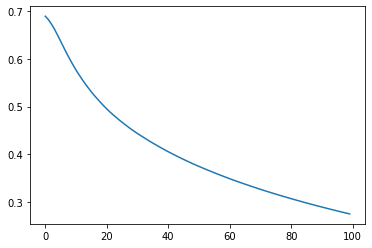

In [37]:
plt.plot(m_g_losses)

In [100]:
m_g_model.save_weights('./save_weights/m_g_model_weights.h5')

### User Movie Embedding 모델 학습

In [80]:
MAX_EPOCH = 150
INIT_USER_BATCH_SIZE = 64
FINAL_USER_BATCH_SIZE = 1024

In [81]:
u_m_model = UserMovieEmbedding(LEN_USERS, EMBEDDING_SIZE)

In [82]:
u_m_model([np.zeros((1)),np.zeros((1,100))])
u_m_model.summary()

Model: "user_movie_embedding_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 2)]               0         
_________________________________________________________________
user_embedding (Embedding)   multiple                  604100    
_________________________________________________________________
movie_user_dot (Dot)         multiple                  0         
_________________________________________________________________
dense_6 (Dense)              multiple                  2         
Total params: 604,102
Trainable params: 604,102
Non-trainable params: 0
_________________________________________________________________


In [83]:
# optimizer
optimizer = tf.keras.optimizers.Adam()
# loss
bce = tf.keras.losses.BinaryCrossentropy()

In [84]:
u_m_train_loss = tf.keras.metrics.Mean(name='train_loss')
u_m_train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')


@tf.function
def u_m_train_step(u_m_inputs, labels):
    with tf.GradientTape() as tape:
        # training=True is only needed if there are layers with different
        # behavior during training versus inference (e.g. Dropout).
        predictions = u_m_model(u_m_inputs, training=True)
        loss = bce(labels, predictions)
    gradients = tape.gradient(loss, u_m_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, u_m_model.trainable_variables))

    u_m_train_loss(loss)
    u_m_train_accuracy(labels, predictions)

In [85]:
# for log
u_m_losses = []

for epoch in range(MAX_EPOCH):
    
    batch_size = INIT_USER_BATCH_SIZE * (epoch+1)
    if batch_size > FINAL_USER_BATCH_SIZE:
        batch_size = FINAL_USER_BATCH_SIZE
    u_m_generator = generate_user_movie_batch(u_m_pairs, batch_size)
    
    for step in range(len(user_movie_rating_df)//batch_size):
        # embedding layer update
        u_batch, m_batch, u_m_label_batch = next(u_m_generator)
        m_batch = m_g_model.get_layer('movie_embedding')(m_batch)
        u_m_train_step([u_batch, m_batch], u_m_label_batch)
        
        print(f'{epoch} epoch, Batch size : {batch_size}, {step} steps, Loss: {u_m_train_loss.result():0.4f}, Accuracy: {u_m_train_accuracy.result() * 100:0.1f}', end='\r')

    u_m_losses.append(u_m_train_loss.result())

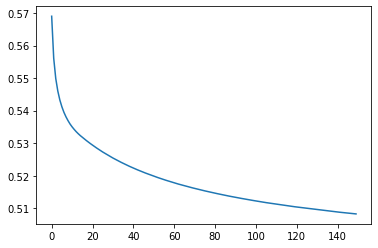

In [86]:
plt.plot(u_m_losses)

In [101]:
u_m_model.save_weights('./save_weights/u_m_model_weights.h5')

### 시각화 

In [87]:
# # 모델 가중치 불러오기
# model.load_weights('./save_weights/embedding_24epoch.h5')

In [88]:
# embedded movie dataframe 만들기
embedded_movie = movies_genres_df['MovieID'].apply(m_g_model.get_layer('movie_embedding'))
columns = [x for x in range(100)]
embedded_movie_df = pd.DataFrame(columns = columns)
for data in embedded_movie:
    embedded_movie_df = embedded_movie_df.append(pd.Series(data), ignore_index=True)
embedded_movie_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.093332,0.054559,0.042234,0.079840,0.152123,0.011604,0.053987,0.085051,0.000117,-0.043103,...,0.023077,-0.010476,0.156960,0.109762,-0.033767,0.113289,0.012191,0.082100,0.012821,0.008253
1,0.003564,0.071976,0.001090,0.088211,0.050290,-0.096881,0.019971,0.020837,0.009500,-0.119752,...,0.054679,-0.012541,-0.008038,0.158429,-0.068696,0.087998,0.012268,0.092088,-0.122652,0.142237
2,-0.099433,-0.094897,0.135711,-0.047242,-0.006963,0.112073,0.130471,0.036016,0.019947,0.087317,...,-0.023246,-0.076842,0.085928,0.092087,-0.008873,0.116439,0.134622,0.070571,-0.027052,-0.084040
3,-0.104844,-0.094697,0.023549,-0.044345,0.088470,0.108242,0.080576,0.078417,-0.079836,0.027252,...,-0.032989,0.047098,0.009767,-0.024316,0.104202,0.073240,0.104332,-0.061675,0.073864,-0.051979
4,-0.033804,0.001619,0.078146,0.064851,0.030225,0.059020,0.101913,0.149670,-0.094411,0.077843,...,0.055827,0.018668,0.037229,0.060324,0.038957,0.026387,0.063597,0.013593,0.072797,-0.132894


In [89]:
# PCA를 이용한 차원 축소
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

movie_scaled = StandardScaler().fit_transform(embedded_movie_df)
pca = PCA(n_components=2)
pca.fit(movie_scaled)
movie_pca = pca.transform(movie_scaled)
pca_columns=[f'{n}' for n in range(2)]
movie_df_pca = pd.DataFrame(movie_pca,columns=pca_columns)
movie_df_pca = pd.concat([movie_df_pca, movies_df["Title"]], axis=1)
movie_df_pca = pd.concat([movie_df_pca, movies_df["Genres"]], axis=1)
movie_df_pca.head()

,0,1,Title,Genres
0,8.123592,-0.793259,Toy Story (1995),Animation|Children's|Comedy
1,4.221459,3.882291,Jumanji (1995),Adventure|Children's|Fantasy
2,5.044415,-4.752861,Grumpier Old Men (1995),Comedy|Romance
3,-1.014865,-6.588581,Waiting to Exhale (1995),Comedy|Drama
4,5.887658,-2.898560,Father of the Bride Part II (1995),Comedy


In [90]:
# 시각화
fig = px.scatter(movie_df_pca, x='0', y='1', color='Genres')
fig.show()

In [91]:
# T-SNE를 이용한 차원 축소
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2).fit_transform(embedded_movie_df)
tsne_df = pd.DataFrame({'x': tsne[:, 0], 'y':tsne[:, 1]})
tsne_df = pd.concat([tsne_df, movies_df["Title"]], axis=1)
tsne_df = pd.concat([tsne_df, movies_df["Genres"]], axis=1)
tsne_df.head()

,x,y,Title,Genres
0,-0.838066,-2.160732,Toy Story (1995),Animation|Children's|Comedy
1,-2.758287,-28.649849,Jumanji (1995),Adventure|Children's|Fantasy
2,-53.134041,-11.452703,Grumpier Old Men (1995),Comedy|Romance
3,51.047073,31.389648,Waiting to Exhale (1995),Comedy|Drama
4,2.756048,45.621483,Father of the Bride Part II (1995),Comedy


In [92]:
# 시각화
fig = px.scatter(tsne_df, x='x', y='y', color='Genres')
fig.show()

In [93]:
# embedded user dataframe 만들기
embedded_user = users_df['UserID'].apply(np.int32).apply(u_m_model.get_layer('user_embedding'))
columns = [x for x in range(100)]
embedded_user_df = pd.DataFrame(columns = columns)
for data in embedded_user:
    embedded_user_df = embedded_user_df.append(pd.Series(data.numpy()), ignore_index=True)
embedded_user_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.130685,-0.270184,0.324508,-0.377644,-0.724945,0.175038,-0.703113,0.570921,-0.364283,1.097158,...,0.288690,-0.170130,-0.860661,0.060304,0.000444,-0.198173,0.256815,-0.081823,0.040231,-1.312867
1,-0.008609,0.726532,0.541435,-0.055963,0.062227,0.143653,0.795951,0.408926,0.180221,0.288036,...,-0.163718,0.465577,0.010689,0.657602,-0.411102,-0.268949,0.059578,0.081747,0.140899,-0.386997
2,-0.973125,0.767961,-0.205094,-0.180897,0.022950,-0.177387,0.853821,0.059838,0.102407,-0.755384,...,-0.757761,1.172843,0.520523,-0.097538,-0.255283,-0.415226,-0.073872,0.027939,-0.173638,-0.129407
3,-0.039432,-0.022356,1.657134,-1.057847,0.603786,0.707869,-0.014865,0.382939,-0.315076,0.254390,...,0.166263,-0.103860,-0.117306,0.325863,0.477625,-0.066870,0.631867,0.010493,0.209582,-0.131109
4,-0.036784,-0.063816,-0.558864,-0.105607,-0.332578,-0.182897,0.601597,-0.089849,0.100247,-0.436946,...,-0.248215,0.286065,-0.050590,0.647695,-0.353587,-0.132215,0.024572,0.087640,-0.243490,-0.131801


In [94]:
users_df.head()

,UserID,Gender,Age,Occupation,Zip-code
0,1,F,1,10,48067
1,2,M,56,16,70072
2,3,M,25,15,55117
3,4,M,45,7,02460
4,5,M,25,20,55455


In [95]:
# PCA를 이용한 차원 축소
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

user_scaled = StandardScaler().fit_transform(embedded_user_df)
pca = PCA(n_components=2)
pca.fit(user_scaled)
user_pca = pca.transform(user_scaled)
pca_columns=[f'{n}' for n in range(2)]
user_df_pca = pd.DataFrame(user_pca,columns=pca_columns)
user_df_pca = pd.concat([user_df_pca, users_df["Gender"]], axis=1)
user_df_pca = pd.concat([user_df_pca, users_df["Age"]], axis=1)
user_df_pca = pd.concat([user_df_pca, users_df["Zip-code"]], axis=1)
user_df_pca.head()

,0,1,Gender,Age,Zip-code
0,-2.151982,3.534883,F,1,48067
1,0.974784,1.287593,M,56,70072
2,-2.698149,-2.965410,M,25,55117
3,-6.581020,6.867799,M,45,02460
4,0.981868,-3.654665,M,25,55455


In [96]:
# 시각화
fig = px.scatter(user_df_pca, x='0', y='1', hover_data=user_df_pca)
fig.show()

In [97]:
# T-SNE를 이용한 차원 축소
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2).fit_transform(embedded_user_df)
tsne_df = pd.DataFrame({'x': tsne[:, 0], 'y':tsne[:, 1]})
tsne_df = pd.concat([tsne_df, users_df["Gender"]], axis=1)
tsne_df = pd.concat([tsne_df, users_df["Age"]], axis=1)
tsne_df = pd.concat([tsne_df, users_df["Zip-code"]], axis=1)
tsne_df.head()

,x,y,Gender,Age,Zip-code
0,15.353235,-11.258238,F,1,48067
1,-7.821696,5.678126,M,56,70072
2,52.756809,16.400511,M,25,55117
3,40.018066,-31.763891,M,45,02460
4,-10.158081,29.399788,M,25,55455


In [99]:
# 시각화
fig = px.scatter(tsne_df, x='x', y='y', hover_data=tsne_df)
fig.show()

##  Case2.

In [33]:
LEN_MOVIES = max(movies_genres_df["MovieID"])+1
LEN_GENRES = len(genres)+1
LEN_USERS = max(user_movie_rating_df['UserID'])+1
EMBEDDING_SIZE = 100

In [34]:
class TestUserMovieEmbedding(tf.keras.Model):
    def __init__(self, len_users, len_movies, embedding_size):
        super(TestUserMovieEmbedding, self).__init__()
        self.m_u_input = InputLayer(name='input_layer', input_shape=(2,))
        # embedding
        self.u_embedding = Embedding(name='user_embedding', input_dim=len_users, output_dim=embedding_size)
        self.m_embedding = Embedding(name='movie_embedding', input_dim=len_movies, output_dim=embedding_size)
        # dot product
        self.m_u_merge = Dot(name='movie_user_dot', normalize=False, axes=1)
        # output
        self.m_u_fc = Dense(1, activation='sigmoid')
        
    def call(self, x):
        x = self.m_u_input(x)
        uemb = self.u_embedding(x[0])
        memb = self.m_embedding(x[1])
        m_u = self.m_u_merge([memb, uemb])
        return self.m_u_fc(m_u)

In [36]:
MAX_EPOCH = 150
INIT_USER_BATCH_SIZE = 64
FINAL_USER_BATCH_SIZE = 1024

In [37]:
test_model = TestUserMovieEmbedding(LEN_USERS, LEN_MOVIES, EMBEDDING_SIZE)

test_model([np.zeros((1)),np.zeros((1))])
test_model.summary()

Model: "test_user_movie_embedding"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 2)]               0         
_________________________________________________________________
user_embedding (Embedding)   multiple                  604100    
_________________________________________________________________
movie_embedding (Embedding)  multiple                  395300    
_________________________________________________________________
movie_user_dot (Dot)         multiple                  0         
_________________________________________________________________
dense (Dense)                multiple                  2         
Total params: 999,402
Trainable params: 999,402
Non-trainable params: 0
_________________________________________________________________


In [38]:
# optimizer
optimizer = tf.keras.optimizers.Adam()
# loss
bce = tf.keras.losses.BinaryCrossentropy()

In [39]:
test_train_loss = tf.keras.metrics.Mean(name='train_loss')
test_train_accuracy = tf.keras.metrics.BinaryAccuracy(name='train_accuracy')


@tf.function
def test_train_step(test_inputs, labels):
    with tf.GradientTape() as tape:
        # training=True is only needed if there are layers with different
        # behavior during training versus inference (e.g. Dropout).
        predictions = test_model(test_inputs, training=True)
        loss = bce(labels, predictions)
    gradients = tape.gradient(loss, test_model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, test_model.trainable_variables))

    test_train_loss(loss)
    test_train_accuracy(labels, predictions)

In [45]:
# for log
test_losses = []

for epoch in range(MAX_EPOCH):
    
    batch_size = INIT_USER_BATCH_SIZE * (epoch+1)
    if batch_size > FINAL_USER_BATCH_SIZE:
        batch_size = FINAL_USER_BATCH_SIZE
    test_generator = generate_user_movie_batch(u_m_pairs, batch_size)
    
    for step in range(len(user_movie_rating_df)//batch_size):
        # embedding layer update
        u_batch, m_batch, u_m_label_batch = next(test_generator)
        test_train_step([u_batch, m_batch], u_m_label_batch)
        
        print(f'{epoch} epoch, Batch size : {batch_size}, {step} steps, Loss: {test_train_loss.result():0.4f}, Accuracy: {test_train_accuracy.result() * 100:0.1f}', end='\r')

    test_losses.append(test_train_loss.result())

In [46]:
# embedded movie dataframe 만들기
embedded_movie = movies_genres_df['MovieID'].apply(test_model.get_layer('movie_embedding'))
columns = [x for x in range(100)]
embedded_movie_df = pd.DataFrame(columns = columns)
for data in embedded_movie:
    embedded_movie_df = embedded_movie_df.append(pd.Series(data), ignore_index=True)
embedded_movie_df.head()

# PCA를 이용한 차원 축소
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

movie_scaled = StandardScaler().fit_transform(embedded_movie_df)
pca = PCA(n_components=2)
pca.fit(movie_scaled)
movie_pca = pca.transform(movie_scaled)
pca_columns=[f'{n}' for n in range(2)]
movie_df_pca = pd.DataFrame(movie_pca,columns=pca_columns)
movie_df_pca = pd.concat([movie_df_pca, movies_df["Title"]], axis=1)
movie_df_pca = pd.concat([movie_df_pca, movies_df["Genres"]], axis=1)
movie_df_pca.head()

# 시각화
fig = px.scatter(movie_df_pca, x='0', y='1', color='Genres')
fig.show()

In [47]:
# T-SNE를 이용한 차원 축소
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2).fit_transform(embedded_movie_df)
tsne_df = pd.DataFrame({'x': tsne[:, 0], 'y':tsne[:, 1]})
tsne_df = pd.concat([tsne_df, movies_df["Title"]], axis=1)
tsne_df = pd.concat([tsne_df, movies_df["Genres"]], axis=1)
tsne_df.head()

# 시각화
fig = px.scatter(tsne_df, x='x', y='y', color='Genres')
fig.show()

In [48]:
# embedded user dataframe 만들기
embedded_user = users_df['UserID'].apply(np.int32).apply(test_model.get_layer('user_embedding'))
columns = [x for x in range(100)]
embedded_user_df = pd.DataFrame(columns = columns)
for data in embedded_user:
    embedded_user_df = embedded_user_df.append(pd.Series(data.numpy()), ignore_index=True)
embedded_user_df.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.486782,0.886084,-0.508831,0.300344,0.670257,-0.163522,0.787697,-0.474284,1.739487,0.036352,...,0.143191,-0.708519,-1.100856,0.810196,1.331659,0.890418,-0.355406,0.211686,0.062820,-0.316764
1,0.111057,-0.249354,-1.288639,0.777715,-0.176240,0.599302,0.011622,-0.330237,0.248955,1.458338,...,-0.484090,0.830305,-0.224823,0.356869,0.708633,0.352572,0.808037,-0.734544,1.249656,-0.284898
2,-0.023967,-0.329481,-1.374612,0.051271,-1.684946,1.009971,0.428597,0.225966,-0.546397,-0.068049,...,-1.249799,0.930788,-0.176693,-0.060154,0.728800,-0.327415,-0.380246,-0.467575,-0.353990,0.079653
3,0.198312,0.437309,-0.938613,1.270280,-0.947430,0.899381,-0.672337,0.629741,1.654437,0.509234,...,0.115693,1.018256,-0.028388,1.026199,0.634964,0.370520,-0.997133,-0.441125,0.157323,0.435599
4,-1.156408,-0.348420,-0.837955,0.863230,0.386668,1.281341,0.841926,-0.512772,0.502674,1.056151,...,1.018318,0.118126,0.077688,-0.072086,-0.116041,0.095164,0.001755,-0.642335,0.037114,-1.176878


In [49]:
# T-SNE를 이용한 차원 축소
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2).fit_transform(embedded_user_df)
tsne_df = pd.DataFrame({'x': tsne[:, 0], 'y':tsne[:, 1]})
tsne_df = pd.concat([tsne_df, users_df["Gender"]], axis=1)
tsne_df = pd.concat([tsne_df, users_df["Age"]], axis=1)
tsne_df = pd.concat([tsne_df, users_df["Zip-code"]], axis=1)
tsne_df.head()

,x,y,Gender,Age,Zip-code
0,-15.250026,0.970297,F,1,48067
1,-13.271210,9.253666,M,56,70072
2,32.158730,-15.662088,M,25,55117
3,24.432652,21.551394,M,45,02460
4,-15.994596,-19.395355,M,25,55455


In [50]:
# 시각화
fig = px.scatter(tsne_df, x='x', y='y', color='Age', hover_data=tsne_df)
fig.show()

In [51]:
test_model.save_weights('./save_weights/user_movie_at_once.h5')